# 🩻🧑‍⚕️Capstone Project : T1 to T2 MRI Images Style Transfer Using CycleGAN

### Submitted By :
- Gursewak Singh
- Rinkal Rohara

## Introduction
Misdiagnosis in the medical field is a very serious issue but it’s also uncomfortably common to occur. Imaging procedures in the medical field requires an expert radiologist’s opinion since interpreting them is not a simple binary process ( Normal or Abnormal). Even so, one radiologist may see something that another does not. This can lead to conflicting reports and make it difficult to effectively recommend treatment options to the patient.

One of the complicated tasks in medical imaging is to diagnose MRI(Magnetic Resonance Imaging). Sometimes to interpret the scan, the radiologist needs different variations of the imaging which can drastically enhance the accuracy of diagnosis by providing practitioners with a more comprehensive understanding.

But to have access to different imaging is difficult and expensive. With the help of deep learning, we can use style transfer to generate artificial MRI images of different contrast levels from existing MRI scans. This will help to provide a better diagnosis with the help of an additional image.

In this capstone project, we will use CycleGAN to translate the style of one MRI image to another, which will help in a better understanding of the scanned image. Using GANs we will create T2 weighted images from T1 weighted MRI image and vice-versa.



## Problem Statement
To build a Generative adversarial model(modified U-Net) which can generate artificial MRI images of different contrast levels from existing MRI scans.


## Project Pipeline
The project pipeline can be briefly summarized in the following steps:
- **Importing Libraries**
- **Data Understanding and Visualization**: Here, we load the data and create the dataset for it.
- **Image Processing**: In this step, we will  process the images using different steps.
- **Model-Building**: This is the final step in which we will create our Generators and Discriminators using a modified U-Net architecture(similar to CycleGAN).
-**Model-Training**: We will also define the loss function and training step for model training.
- **Generating a GIF** : This will help us understanding how to T2 images is generated throughout epochs

## Importing Libraries

Libraries -

1.   numpy
2.   tensorflow
3.   matplotlib
4.   skimage

In [46]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from skimage.transform import resize
from tensorflow.keras.utils import plot_model
from keras.preprocessing.image import load_img
import imageio
import glob
import pathlib
import time

import warnings
warnings.filterwarnings('ignore')

## Data Understanding and Visualization


Here, we load the data and create the dataset for it.

In [47]:
# setting rooth path to dataset rar file
root_path = "./drive/MyDrive/Capstone-Style-Transfer-Using-GAN/MRI+T1_T2+Dataset.RAR"

In [48]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [49]:
# unzip and extract the images from .rar file
!unrar x $root_path -y


UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from ./drive/MyDrive/Capstone-Style-Transfer-Using-GAN/MRI+T1_T2+Dataset.RAR

Extracting  Tr1/.DS_Store                                                  0%  OK 
Extracting  Tr1/TrainT1/Image #10.png                                      1%  OK 
Extracting  Tr1/TrainT1/Image #11.png                                      2%  OK 
Extracting  Tr1/TrainT1/Image #12.png                                      3%  OK 
Extracting  Tr1/TrainT1/Image #13.png                                      4%  OK 
Extracting  Tr1/TrainT1/Image #14.png                                      5%  OK 
Extracting  Tr1/TrainT1/Image #15.png                                      6%  OK 
Extracting  Tr1/TrainT1/Image #16.png                                      7%  OK 
Extracting  Tr1/TrainT1/Image #17.png                                      8%  OK 
Extract

In [50]:
# Setting paths to extrancted T1 and T2 directory
T1_path = pathlib.Path("/content/Tr1/")
T2_path = pathlib.Path("/content/Tr2/")

In [51]:
# Print the original shape of provided images
t1_img_paths = list(T1_path.glob("*/*.png"))
t2_img_paths = list(T2_path.glob("*/*.png"))

print("Images Count of T1 and T2: ",len(t1_img_paths), len(t1_img_paths))
print(tf.shape(load_img(t1_img_paths[0])))
print(tf.shape(load_img(t2_img_paths[0])))

Images Count of T1 and T2:  43 43
tf.Tensor([217 181   3], shape=(3,), dtype=int32)
tf.Tensor([217 181   3], shape=(3,), dtype=int32)


Since the images are provided of shape (217 X 181), Which is not good for Model. We need to reshape it to size  (256 x 256), which is a power of 2. Moreover, the size of dataset of T1 and T2 images is 43 and 42, we will set the Batch size to 1.

In [52]:
# Declare batch size to 1, image height to 256 and image width to 256
BATCH_SIZE = 1
IMG_HEIGHT = 256
IMG_WIDTH = 256

Loading the T1 and T2 images from directory and creating two datasets.
Since the both images have 3 channels (RGB), we need to convert them to single channel images (Grayscale).

In [53]:
#loading images from T1 and T2 path, setting color_mode to grayscale.
T1_images_dataset = tf.keras.preprocessing.image_dataset_from_directory(T1_path,
                                                    color_mode='grayscale',
                                                    batch_size=None,
                                                    image_size=(IMG_HEIGHT , IMG_WIDTH),
                                                    seed=42,
                                                    labels=None)
T2_images_dataset = tf.keras.preprocessing.image_dataset_from_directory(T2_path,
                                                    color_mode='grayscale',
                                                    batch_size=None,
                                                    image_size=(IMG_HEIGHT , IMG_WIDTH),
                                                    seed=42,
                                                    labels=None)

Found 43 files belonging to 1 classes.
Found 46 files belonging to 1 classes.


In [54]:
#checking the shape of loaded dataset
print(T1_images_dataset)
print(T2_images_dataset)

<_PrefetchDataset element_spec=TensorSpec(shape=(256, 256, 1), dtype=tf.float32, name=None)>
<_PrefetchDataset element_spec=TensorSpec(shape=(256, 256, 1), dtype=tf.float32, name=None)>


### Data Visualization
Visualizing the loaded data

In [55]:
t1_image = next(iter(T1_images_dataset))
t2_image = next(iter(T2_images_dataset))

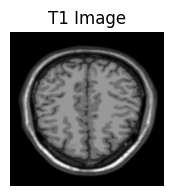

In [56]:
plt.figure(figsize=(2, 2))
plt.imshow(t1_image.numpy()[:, :, 0],cmap='gray')
plt.title('T1 Image')
plt.axis('off')
plt.show()

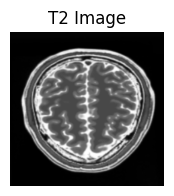

In [57]:
plt.figure(figsize=(2, 2))
plt.imshow(t2_image.numpy()[:, :, 0],cmap='gray')
plt.title('T2 Image')
plt.axis('off')
plt.show()

## Data Preprocessing
1. Resize
2. Reshape
3. Normalize
4. Batch and shuffle

Since Resize, reshape to single channel is already handled by keras while importing the dataset from directory. We will move with Normalizing, and Shuffling of data

In [58]:
# define the function to Normalize the data to 1 and -1

def normalize(image):
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    return image

In [59]:
#Declare Buffer size to shuffle the data
BUFFER_SIZE = 1000
T1 = T1_images_dataset.map(normalize).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
T2 = T2_images_dataset.map(normalize).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
print(T1)
print(T2)

<_BatchDataset element_spec=TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None)>
<_BatchDataset element_spec=TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None)>


Visualizing the Processed Data

In [60]:
sample_t1 = next(iter(T1))
sample_t2 = next(iter(T2))

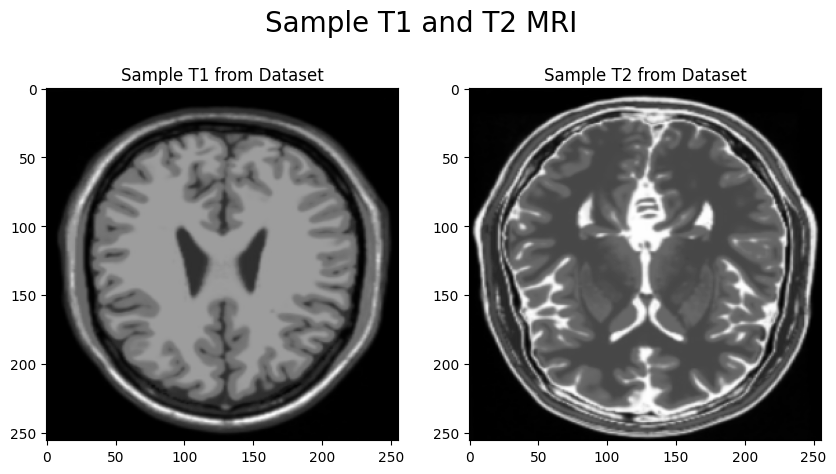

In [61]:
plt.figure(figsize= (10,10))
plt.suptitle('Sample T1 and T2 MRI', fontsize=20, y=0.75)
plt.subplot(121)
plt.title('Sample T1 from Dataset')
plt.imshow(sample_t1[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')

plt.subplot(122)
plt.title('Sample T2 from Dataset')
plt.imshow(sample_t2[0].numpy()[:, :, 0] * 0.5 + 0.5, cmap='gray')

## Model-Building
For model building we are going to follow the following steps:
1. Instance Normalization
2. Downsampling, Upsampling and Unet
3. Generator Building using Unet
4. Discriminator Building

#### Instance Normalization
Instance Normalization is particularly employed in the context of Style Transfer, wherein distinct normalization is executed for each individual sample, encompassing channel-wise normalization.

In [62]:
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

#### Downsampling
We will performe downsample using Convolution, which will reduce the dimensions of the image.

In [63]:
def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Conv2d layer
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    # Add Normalization layer
    if apply_norm:
        result.add(InstanceNormalization())
    # Add Leaky Relu Activation
    result.add(tf.keras.layers.LeakyReLU())
    return result

#### Upsampling
Upsampling is a result of Transposed Convolution, where dimension of image are increased.

In [64]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Transposed Conv2d layer
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    # Add Normalization Layer
    result.add(InstanceNormalization())
    # Conditionally add Dropout layer
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    # Add Relu Activation Layer
    result.add(tf.keras.layers.ReLU())
    return result

#### Unets
Unets takes Image as an input and translate it into another Image.

We will first use Downsampling on Input Image to learn the latent characteristics of Input Image and then use Upsampling to use this knowledge to Translate it into another Image.

Skip connections are introduced for capturing the static elements of an image such as background, which can be mapped directly to the output image. Hence we connect downsampling layers with upsampling layers via direct connections as well. The bottleneck downsampling layer doesn’t have any skip connection as you can see in the unet image.

In [65]:
# UNet generator
def unet_generator():
  inputs = tf.keras.layers.Input(shape=[256,256,1]) # input layer
  # decreasing the image spatial dimension, and increasing the channel (or feature maps) from (256 x 256 x 1) --> (1 x 1 x 512)
  down_stack = [
      downsample(128, 4, apply_norm=False),
      downsample(256, 4),
      downsample(512, 4),
      downsample(512, 4),
      downsample(512, 4),
      downsample(512, 4),
      downsample(512, 4),
      downsample(512, 4),
    ]
  # increasing the image size from (1 x 1 x 512) --> (128 x 128 x 256)
  up_stack = [
      upsample(512, 4, apply_dropout=True),
      upsample(512, 4, apply_dropout=True),
      upsample(512, 4, apply_dropout=True),
      upsample(512, 4),
      upsample(512, 4),
      upsample(256, 4),
      upsample(128, 4),
    ]
  # Adding the last output layer to get the final image with 1 channel (128 x 128 x 256) --> (256 x 256 x 1)
  # we are using tanh activation function as original image was in the range of (-1,1), therefore, we need output image
  # in the same range
  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(1, 4,
                                          strides=2,
                                          padding='same',
                                          kernel_initializer=initializer,
                                          activation='tanh')

  inputs = tf.keras.layers.Input(shape=[256,256,1])

  x = inputs
  # For skip connections, first store all the downsampling layers in a list.
  skips = []
  # downsampling
  for down in down_stack:
    x = down(x)
    skips.append(x)

  # reverse skips to connect while using upsampling layers through the concat() function as well as removing
  # the last bottleneck layer

  skips = reversed(skips[:-1])
  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])
  x = last(x)
  return tf.keras.Model(inputs=inputs, outputs=x) # returns U-net generator model

#### Generator
Generator is a Unet Network here since We want to translate One type of Image (T1) into Another type of Image (T2).

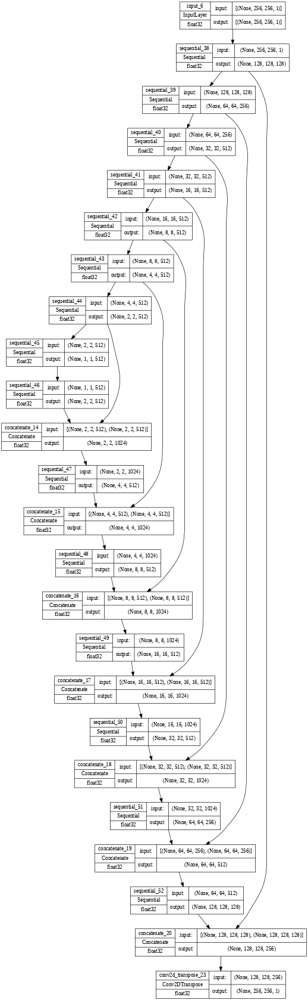

In [66]:
# Initailize Generator G which will transform T1 images to T2
generator_g = unet_generator()

#visualizing our Generator G
plot_model(
    generator_g,
    to_file="unet_generator_model.png",
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=48)


In [67]:
generator_g.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_38 (Sequential)  (None, 128, 128, 128)        2048      ['input_6[0][0]']             
                                                                                                  
 sequential_39 (Sequential)  (None, 64, 64, 256)          524800    ['sequential_38[0][0]']       
                                                                                                  
 sequential_40 (Sequential)  (None, 32, 32, 512)          2098176   ['sequential_39[0][0]']       
                                                                                            

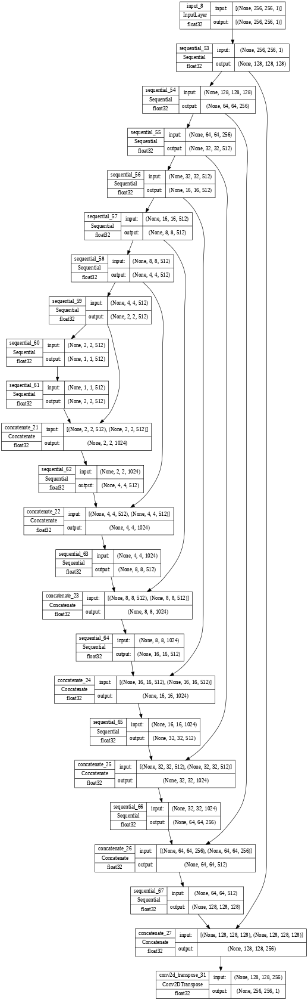

In [68]:
# Initailize Generator F which will transform T2 images to T1
generator_f = unet_generator()

#visualizing our Generator G
plot_model(
    generator_f,
    to_file="unet_generator_model.png",
    show_shapes=True,
    show_dtype=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=48)

In [69]:
generator_f.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_53 (Sequential)  (None, 128, 128, 128)        2048      ['input_8[0][0]']             
                                                                                                  
 sequential_54 (Sequential)  (None, 64, 64, 256)          524800    ['sequential_53[0][0]']       
                                                                                                  
 sequential_55 (Sequential)  (None, 32, 32, 512)          2098176   ['sequential_54[0][0]']       
                                                                                            


We can clearly notice that the image dimension (width, height) is first decreased from size (256, 256) to (1,1). And then increased from size (1,1) to
 form an output image of size (256,256)

#### Discriminator
Discriminator is a traditional CNN, which we use to classify the Images. It only uses Downsampling hence.

Both Discriminators have same architecture

In [70]:
# Discriminators only contain Convolutional Layers and no Transposed Convolution is used
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    # add input layer of size (256, 256, 1)
    inpts = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image')
    x = inpts

    # add downsampling step here
    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32,32, 256)
    down4 = downsample(512, 4)(down3) # (bs, 16,16, 512)
    # add a padding layer here
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down4)

    # implement a concrete downsampling layer here
    conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)

    # apply zero padding layer
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)

    # add a last pure 2D Convolution layer
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)
    return tf.keras.Model(inputs=inpts, outputs=last)

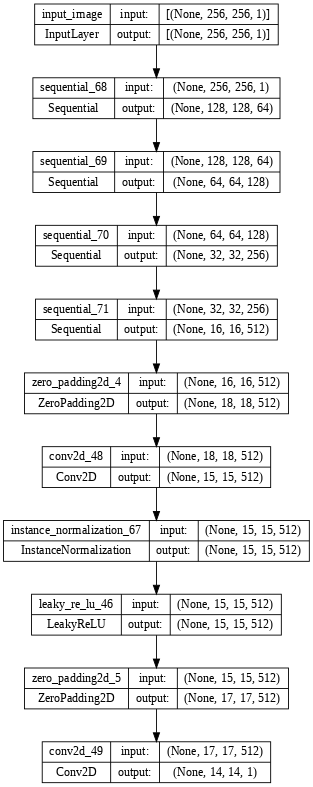

In [71]:
# Initializing the discriminators
discriminator_x = discriminator() # separattes real T1 from Generated T1 (fakes)
plot_model(discriminator_x, show_shapes=True, dpi=64)

In [72]:
discriminator_x.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 1)]     0         
                                                                 
 sequential_68 (Sequential)  (None, 128, 128, 64)      1024      
                                                                 
 sequential_69 (Sequential)  (None, 64, 64, 128)       131328    
                                                                 
 sequential_70 (Sequential)  (None, 32, 32, 256)       524800    
                                                                 
 sequential_71 (Sequential)  (None, 16, 16, 512)       2098176   
                                                                 
 zero_padding2d_4 (ZeroPadd  (None, 18, 18, 512)       0         
 ing2D)                                                          
                                                           

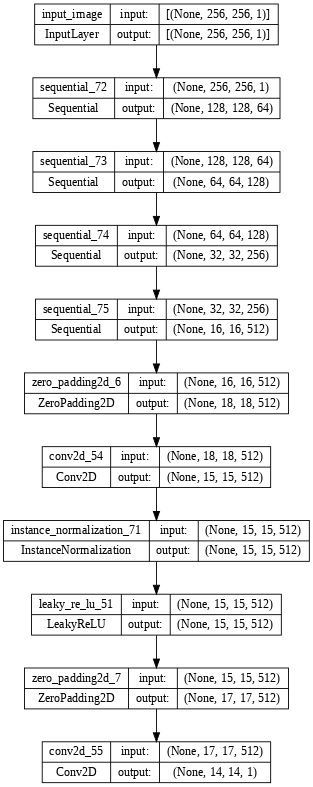

In [73]:
#Initalizing discriminator y which separates real T2 from generated T2
discriminator_y = discriminator()
plot_model(discriminator_y, show_shapes=True, dpi=64)

In [74]:
discriminator_x.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 1)]     0         
                                                                 
 sequential_68 (Sequential)  (None, 128, 128, 64)      1024      
                                                                 
 sequential_69 (Sequential)  (None, 64, 64, 128)       131328    
                                                                 
 sequential_70 (Sequential)  (None, 32, 32, 256)       524800    
                                                                 
 sequential_71 (Sequential)  (None, 16, 16, 512)       2098176   
                                                                 
 zero_padding2d_4 (ZeroPadd  (None, 18, 18, 512)       0         
 ing2D)                                                          
                                                           

As we can notice the above the height and width in the "Output shape" column is decreasing.  The output of dimension (14, 14, 1) is a patch of the image, which are averaged out to get the final output.

## Model Training

Before we go ahead with training we need pre steps namely:

1. Declare Loss type
2. Calculate Discriminator Loss
3. Calculate Generator Loss
4. Cycle Loss
5. Identity Loss
6. Optimizer
7. Checkpoint Initialization
8. Training Flow

Check output of Untrained Generator models which should be a random noise

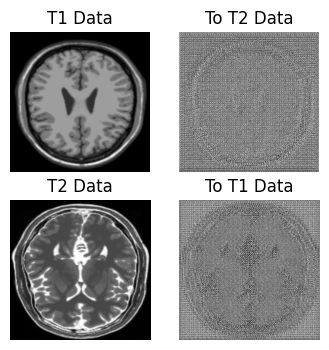

In [75]:
to_t2_data = generator_g(sample_t1)
to_t1_data = generator_f(sample_t2)
plt.figure(figsize=(4, 4))

imgs = [sample_t1, to_t2_data, sample_t2, to_t1_data]
title = ['T1 Data', 'To T2 Data', 'T2 Data', 'To T1 Data']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    plt.imshow(imgs[i][0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
plt.show()

### Declare Loss as Binary Cross Entropy
Since our Discriminator is a classifier therefore loss we have is Binary Crossentropy loss

In [76]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### Discriminator Loss
Coming to discriminator loss, it has two types of losses
1.    Loss on Real Data
2.    Loss on Fake Data

In [77]:
# defining discriminator loss as sum of real loss and generated loss, and using a total discriminator loss weight of 0.5
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5 # mean of losses


### Generator Loss
Generator loss has only one type of loss - Discriminator Loss on Generated data.

In [78]:
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

### Cycle Consistency Loss
Since we have two generator in a sequential manner working on input image, we get a cycled image. Therefore, we have cycle consistency loss as L1 loss between input image and cycled image.


In [79]:
# defining cycle consistency loss function and giving a weight of 10 to loss
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return 10.0 * loss1 # assinging weight of 10 to the loss

### Identity Loss
When we provide input image to the Generator such that no translation is needed because the Image is already transformed. Here also we take L1 Loss between Input and Output Image.

When we provide image of domain x to the generator (y-to-x), we should recieve same image with no tampering whatsoever. There we calculate a identity as L1 loss of input image and generated synthetic image of same image in same domain.

In [80]:
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5*loss

### Optimizer
For faster convergence we will use Adam optimizer. Moreover, we have four models in CycleGAN we create for optimizer. One for each.


In [81]:
# smoothen the training process we are taking beta 1 as 0.5.
generator_g_optimizer = tf.keras.optimizers.Adam(0.001, beta_1=0.5,beta_2=0.999)
generator_f_optimizer = tf.keras.optimizers.Adam(0.001, beta_1=0.5,beta_2=0.999)

discriminator_x_optimizer = tf.keras.optimizers.Adam(0.001, beta_1=0.5,beta_2=0.999)
discriminator_y_optimizer = tf.keras.optimizers.Adam(0.001, beta_1=0.5,beta_2=0.999)

We'll train out Model for 100 Epochs

In [82]:
EPOCHS = 100

### Checkpoint Initialization
Initialize checkpoints to save models to ensures that we save our model of the three latest epochs, so that we do not have to train the model from scratch every time.

In [83]:
#decalring path to store model checkpoints
checkpoint_path =  '/content/T1_To_T2_MRI_checkpoints'

checkpoint = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

checkpoint_manager = tf.train.CheckpointManager(checkpoint, checkpoint_path, max_to_keep=EPOCHS)

# if a checkpoint exists, restore the latest checkpoint.
if checkpoint_manager.latest_checkpoint:
  checkpoint.restore(checkpoint_manager.latest_checkpoint)
  print('LATEST CHECKPOINT RESTORED')

LATEST CHECKPOINT RESTORED


Function to show Images output by Generators while Training

In [84]:
# defining function to plot or visualize result of generated image after every epoch
def generate_images(modelG, test_input_t1, modelF, test_input_t2):
    # tranlation of T1 image to T2 image by model G
    prediction_g = modelG(test_input_t1)

    # translation of T2 image to T1 image by model F
    prediction_f = modelF(test_input_t2)

    plt.figure(figsize=(8, 4))
    display_list = [test_input_t1[0], prediction_g[0], test_input_t2[0], prediction_f[0]]
    title = ['Input Image (T1)', 'Predicted Image', 'Input Image (T2)', 'Predicted Image']
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

### Training FLow
Below Function performs one Flow of Batch Training

Notice that Identity Loss and Cycle Loss are only used in training Generator and not Discriminator

Sequence of Training Flow

1.   Generate Fake Y and Cycled X
2.   Generate Fake X and Cycled Y
3.   Generate Fake Images through G and F for Identity Loss.
4.   Calculate Discriminator Loss for Disc X and Disc Y on Fake Data for Generator Training.
5.   Calculate Generator Loss on Discriminator.
6.   Calculate Cycled Loss on Cycled Images from step 1 and 2.
7.   Calculate Total Generator Loss - Disc Loss + Cycled Loss + Identity Loss
8.   Calculate Discriminator Loss on both Fake and Real Images for Disc X and Y for Disc Training.
9.   Calculate the Gradients and update the weight and bias of models.

In [85]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)

        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)

        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

        # Discriminator's loss
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    # Calculate the gradients for generator g and f. Apply the gradients to the optimizer
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))

    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))

    # Calculate the gradients for discriminator g and f. Apply the gradients to the optimizer
    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))

    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))


### Train the CycleGAN Model for several Epochs
Loop training function for number of epochs and also show the output at each step.

Note how Generators are getting better at producing realistic images epoch by epoch

In [86]:
# defining a function to save the final model trained
def save_final_model(epoch, generator_g, generator_f):
  model_save_path = '/content/saved_model/'
  T1_to_T2_model = model_save_path + 'T1_to_T2_final_model.h5'
  generator_g.save(T1_to_T2_model)
  T2_to_T1_model = model_save_path + 'T2_to_T1_final_model.h5'
  generator_f.save(T2_to_T1_model)
  print('trained models saved at %06d' % (epoch+1))

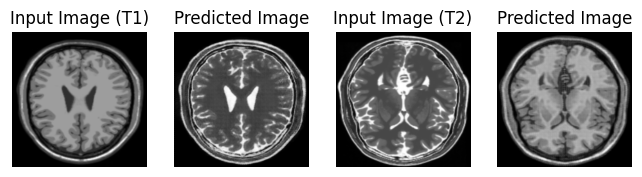

Time taken in 64 seconds for epoch 1



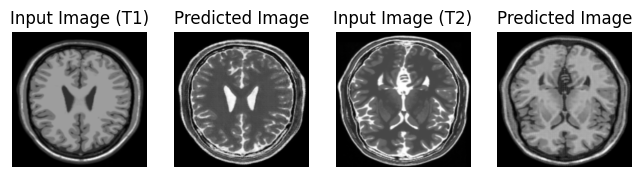

Time taken in 26 seconds for epoch 2



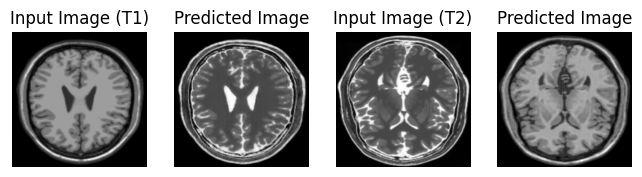

Time taken in 27 seconds for epoch 3



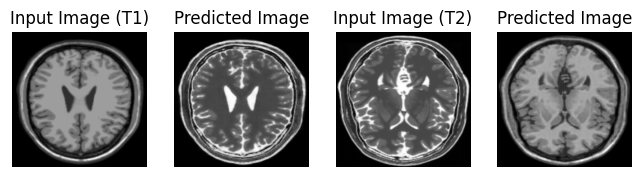

Time taken in 27 seconds for epoch 4



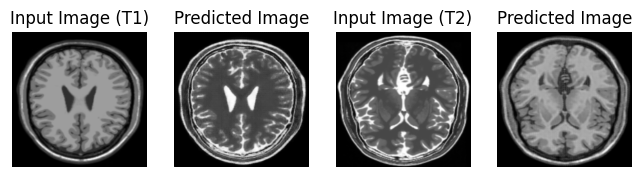

Time taken in 27 seconds for epoch 5



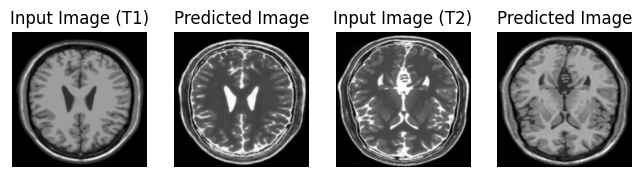

Time taken in 27 seconds for epoch 6



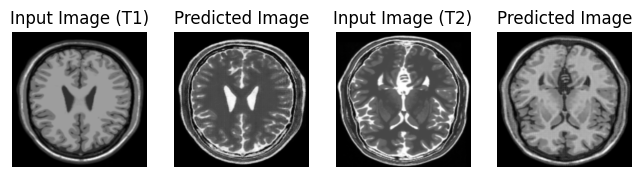

Time taken in 27 seconds for epoch 7



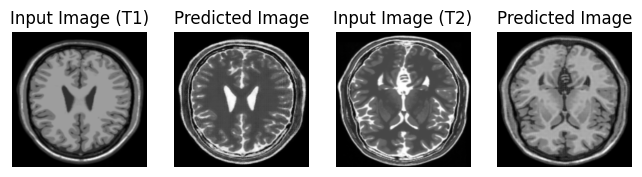

Time taken in 28 seconds for epoch 8



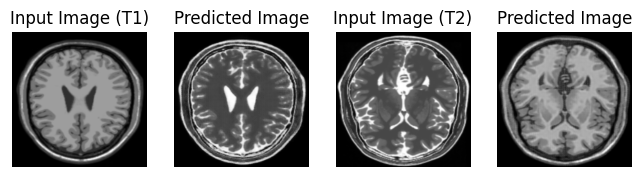

Time taken in 27 seconds for epoch 9



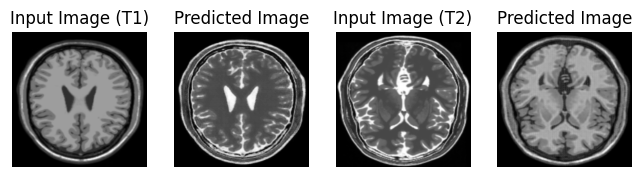

Checkpoint restored for epoch 10 at /content/T1_To_T2_MRI_checkpoints/ckpt-11
Time taken in 35 seconds for epoch 10



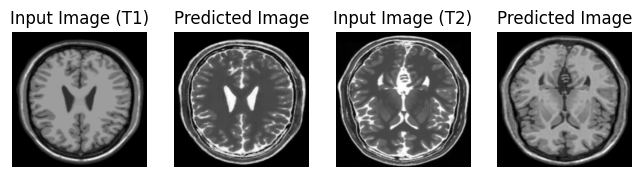

Time taken in 27 seconds for epoch 11



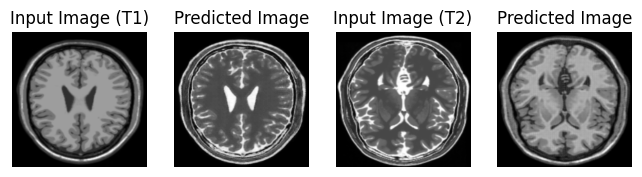

Time taken in 28 seconds for epoch 12



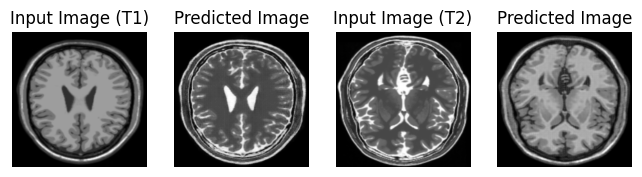

Time taken in 27 seconds for epoch 13



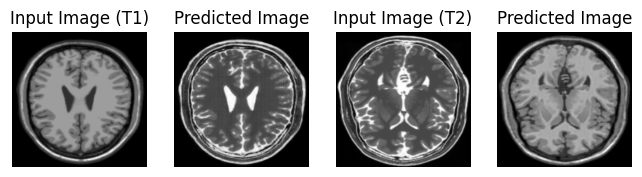

Time taken in 27 seconds for epoch 14



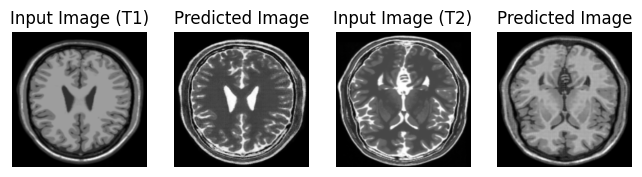

Time taken in 27 seconds for epoch 15



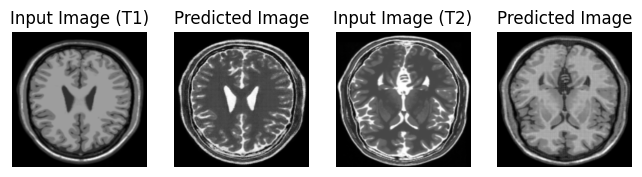

Time taken in 27 seconds for epoch 16



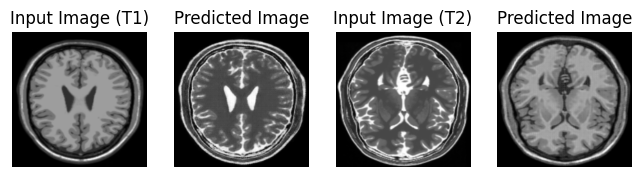

Time taken in 27 seconds for epoch 17



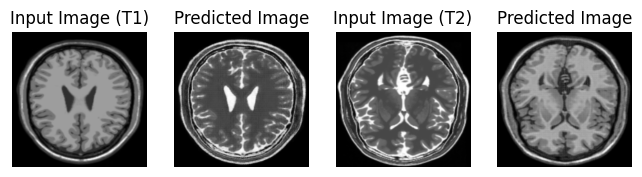

Time taken in 27 seconds for epoch 18



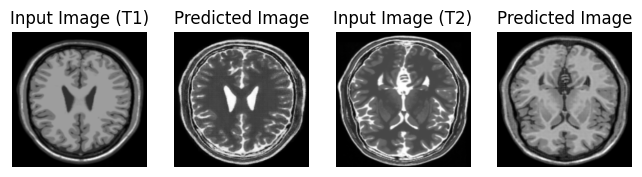

Time taken in 27 seconds for epoch 19



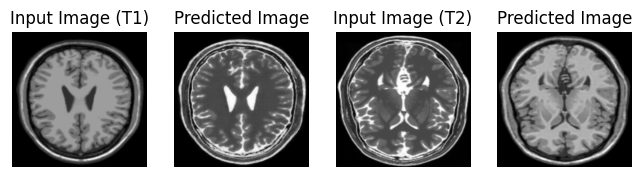

Checkpoint restored for epoch 20 at /content/T1_To_T2_MRI_checkpoints/ckpt-12
Time taken in 46 seconds for epoch 20



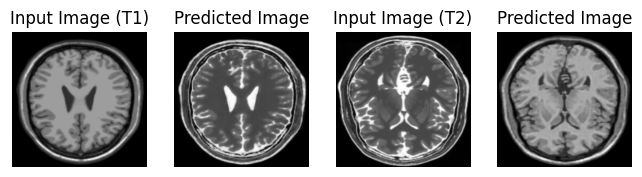

Time taken in 27 seconds for epoch 21



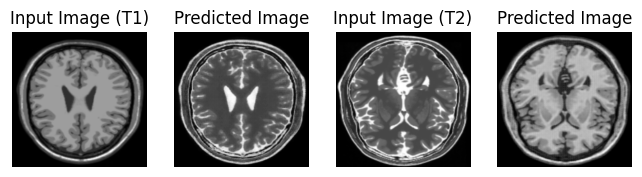

Time taken in 27 seconds for epoch 22



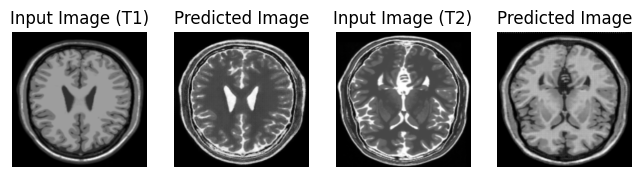

Time taken in 27 seconds for epoch 23



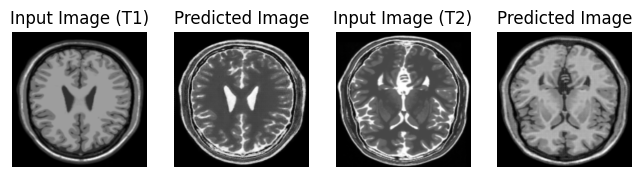

Time taken in 27 seconds for epoch 24



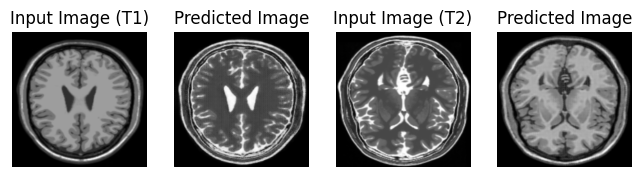

Time taken in 27 seconds for epoch 25



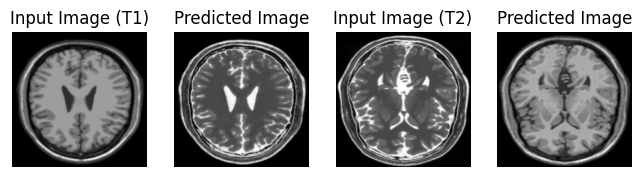

Time taken in 27 seconds for epoch 26



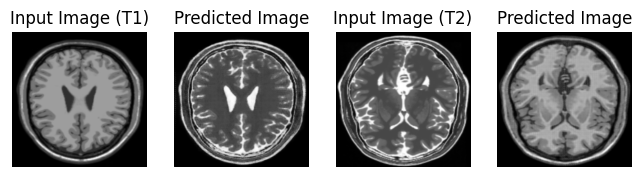

Time taken in 27 seconds for epoch 27



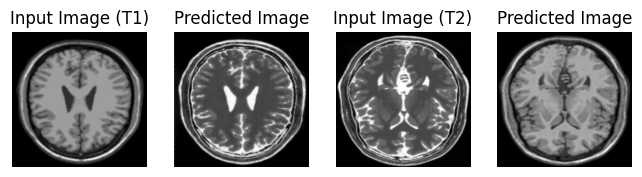

Time taken in 27 seconds for epoch 28



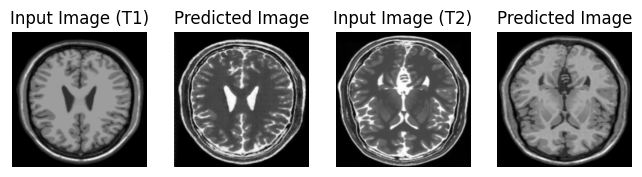

Time taken in 27 seconds for epoch 29



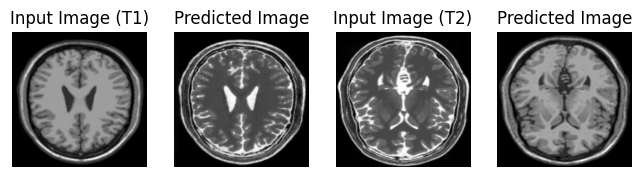

Checkpoint restored for epoch 30 at /content/T1_To_T2_MRI_checkpoints/ckpt-13
Time taken in 36 seconds for epoch 30



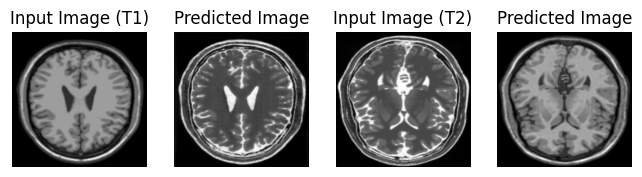

Time taken in 27 seconds for epoch 31



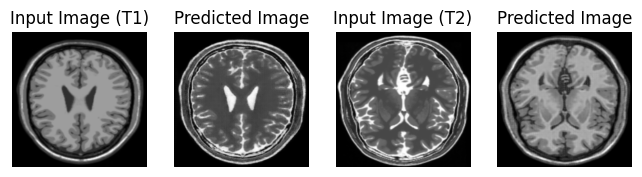

Time taken in 28 seconds for epoch 32



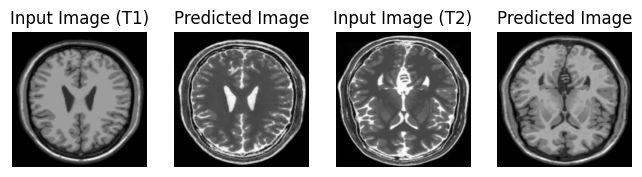

Time taken in 27 seconds for epoch 33



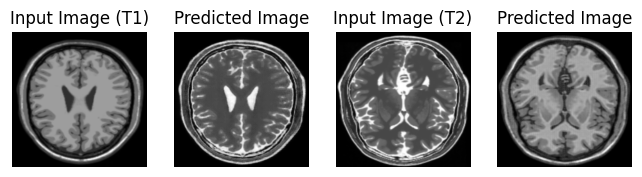

Time taken in 27 seconds for epoch 34



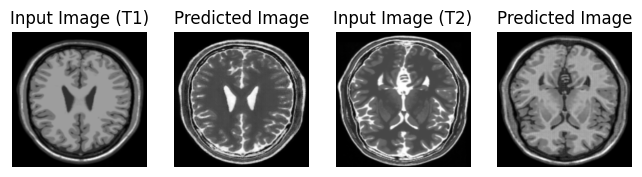

Time taken in 27 seconds for epoch 35



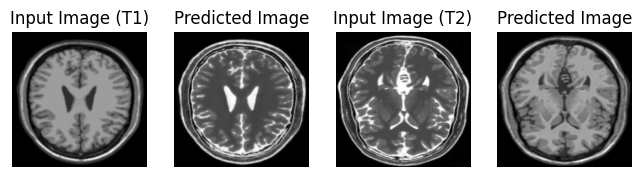

Time taken in 27 seconds for epoch 36



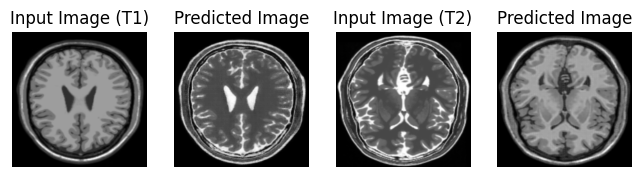

Time taken in 27 seconds for epoch 37



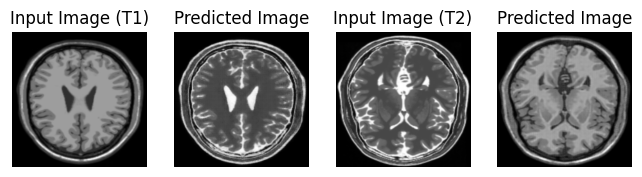

Time taken in 27 seconds for epoch 38



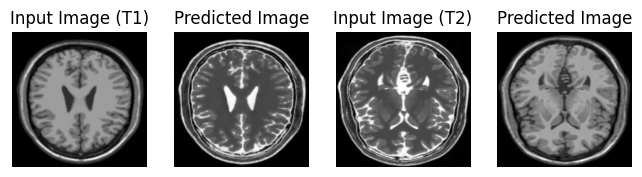

Time taken in 27 seconds for epoch 39



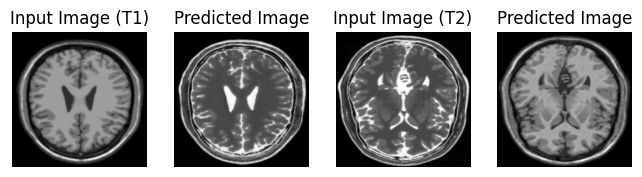

Checkpoint restored for epoch 40 at /content/T1_To_T2_MRI_checkpoints/ckpt-14
Time taken in 35 seconds for epoch 40



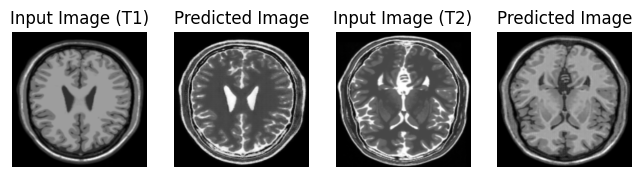

Time taken in 27 seconds for epoch 41



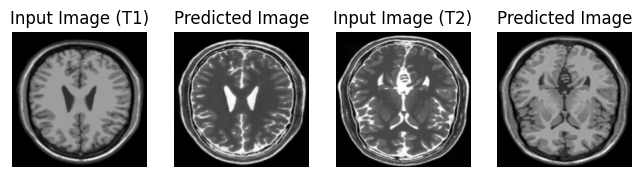

Time taken in 27 seconds for epoch 42



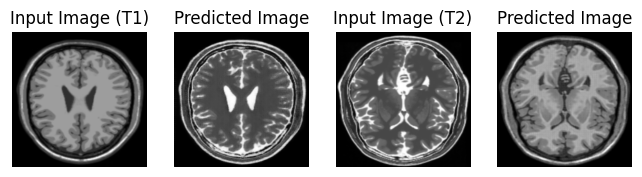

Time taken in 27 seconds for epoch 43



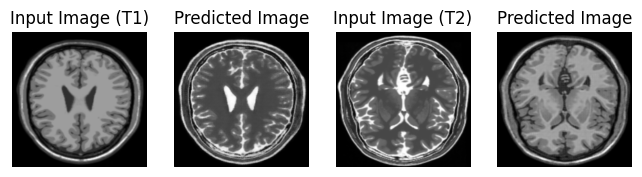

Time taken in 27 seconds for epoch 44



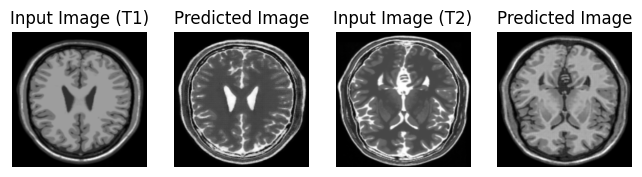

Time taken in 27 seconds for epoch 45



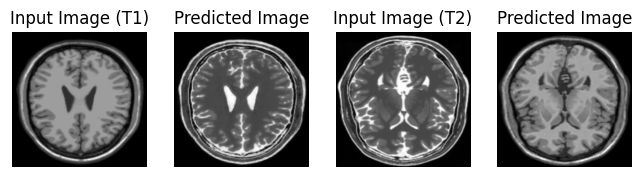

Time taken in 27 seconds for epoch 46



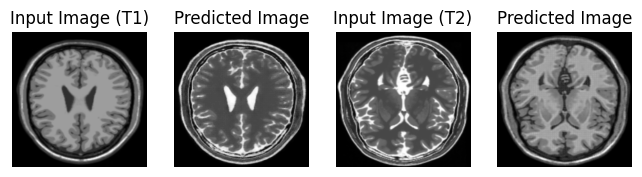

Time taken in 27 seconds for epoch 47



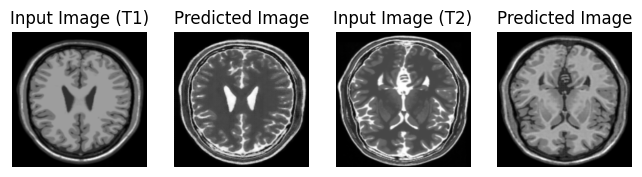

Time taken in 27 seconds for epoch 48



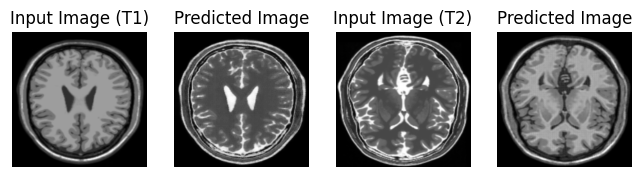

Time taken in 27 seconds for epoch 49



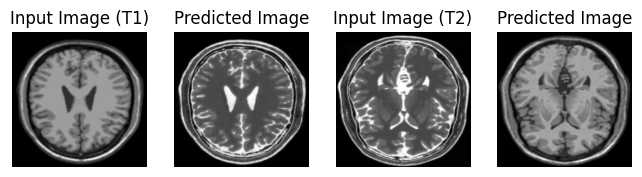

Checkpoint restored for epoch 50 at /content/T1_To_T2_MRI_checkpoints/ckpt-15
Time taken in 36 seconds for epoch 50



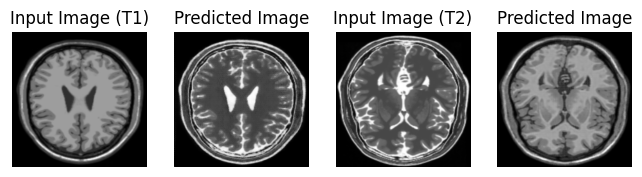

Time taken in 27 seconds for epoch 51



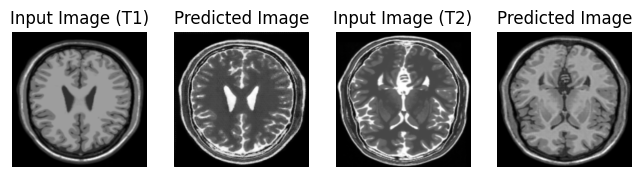

Time taken in 27 seconds for epoch 52



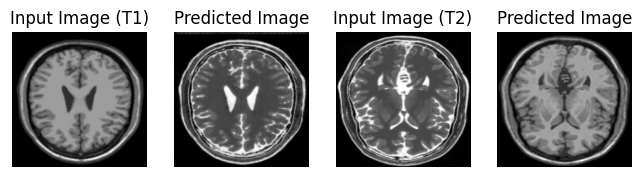

Time taken in 27 seconds for epoch 53



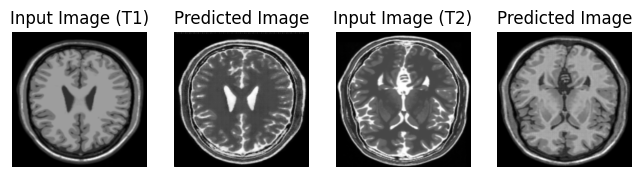

Time taken in 27 seconds for epoch 54



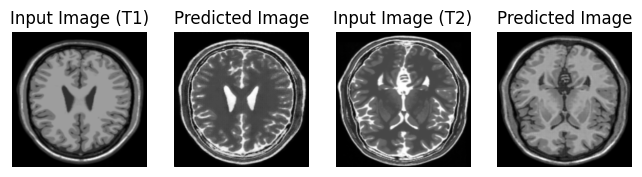

Time taken in 42 seconds for epoch 55



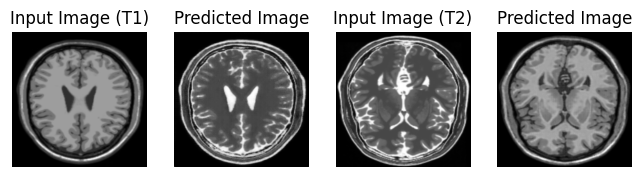

Time taken in 27 seconds for epoch 56



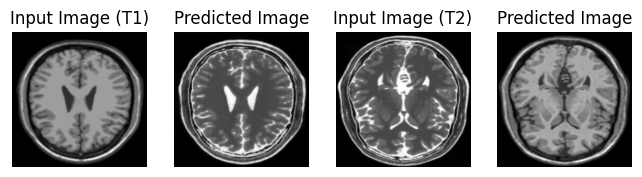

Time taken in 28 seconds for epoch 57



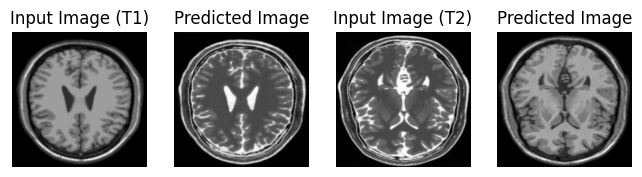

Time taken in 27 seconds for epoch 58



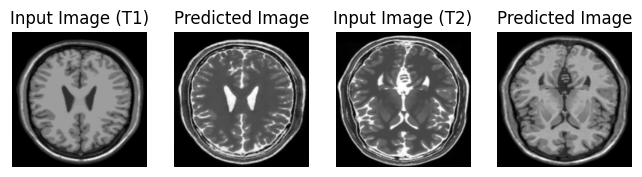

Time taken in 27 seconds for epoch 59



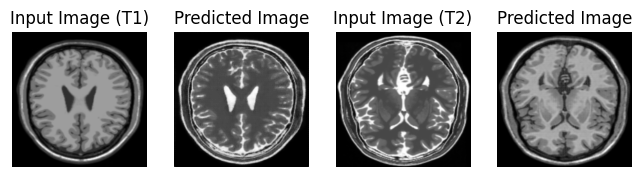

Checkpoint restored for epoch 60 at /content/T1_To_T2_MRI_checkpoints/ckpt-16
Time taken in 39 seconds for epoch 60



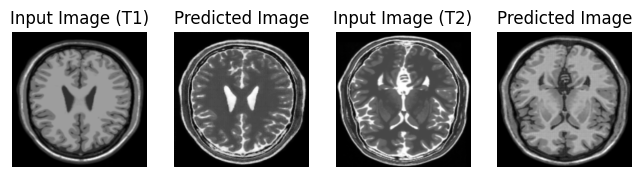

Time taken in 27 seconds for epoch 61



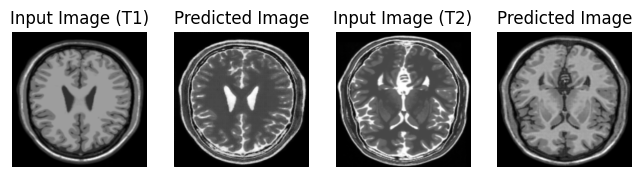

Time taken in 27 seconds for epoch 62



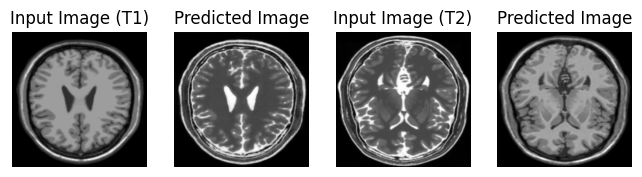

Time taken in 27 seconds for epoch 63



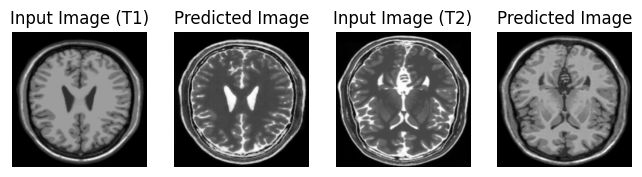

Time taken in 27 seconds for epoch 64



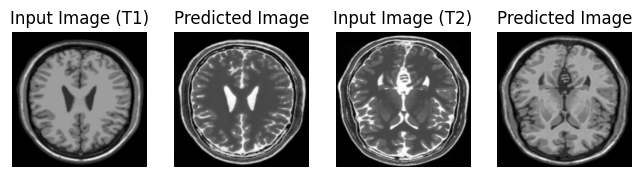

Time taken in 27 seconds for epoch 65



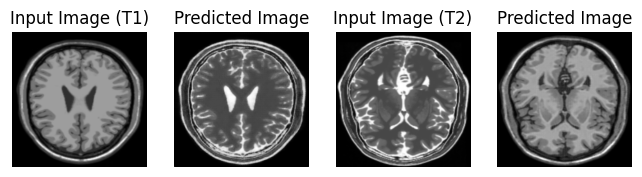

Time taken in 27 seconds for epoch 66



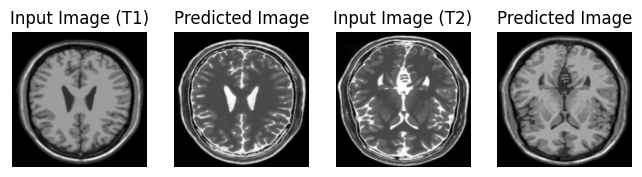

Time taken in 27 seconds for epoch 67



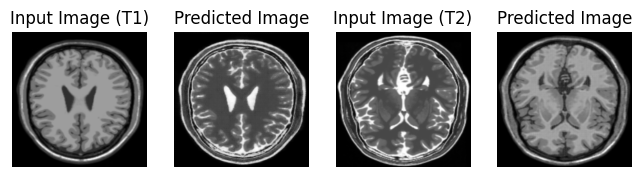

Time taken in 27 seconds for epoch 68



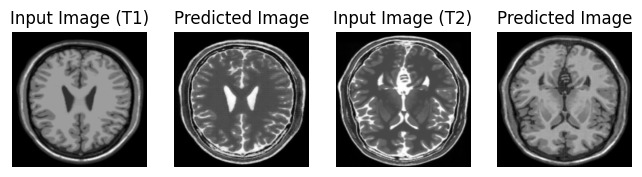

Time taken in 27 seconds for epoch 69



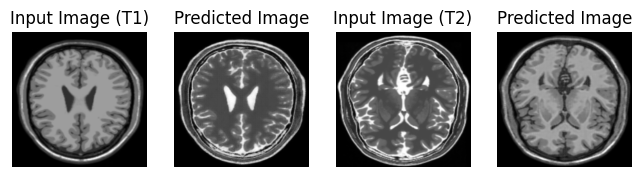

Checkpoint restored for epoch 70 at /content/T1_To_T2_MRI_checkpoints/ckpt-17
Time taken in 39 seconds for epoch 70



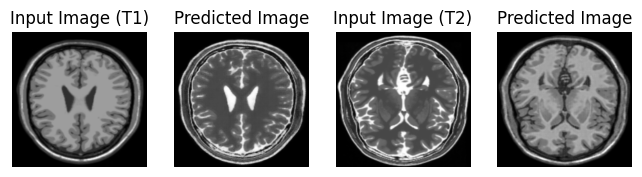

Time taken in 27 seconds for epoch 71



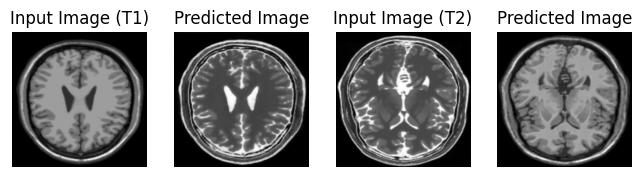

Time taken in 27 seconds for epoch 72



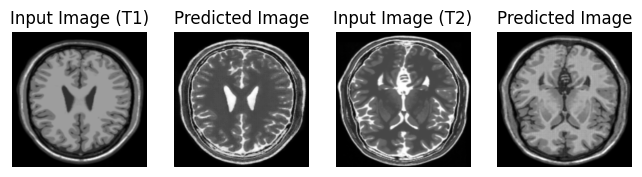

Time taken in 27 seconds for epoch 73



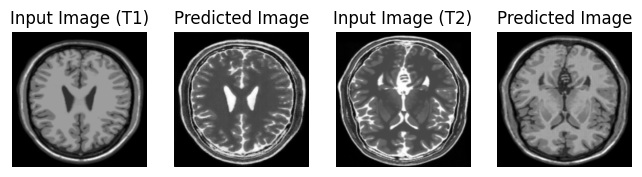

Time taken in 27 seconds for epoch 74



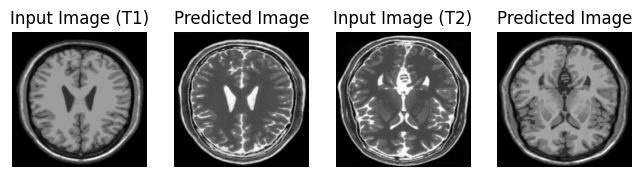

Time taken in 27 seconds for epoch 75



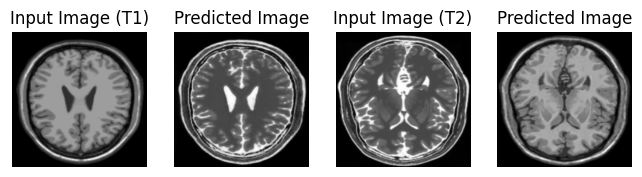

Time taken in 27 seconds for epoch 76



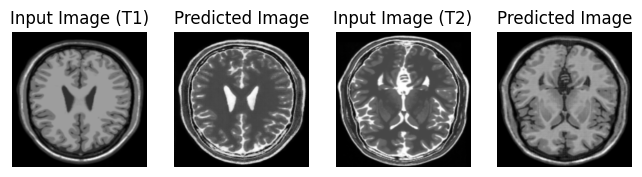

Time taken in 27 seconds for epoch 77



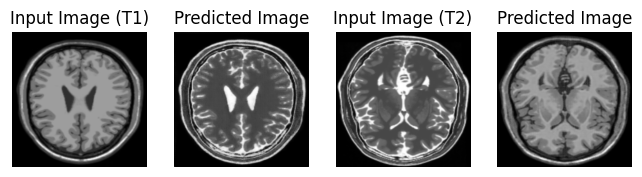

Time taken in 27 seconds for epoch 78



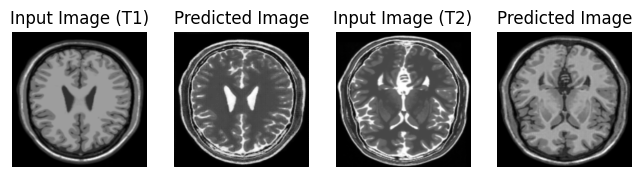

Time taken in 27 seconds for epoch 79



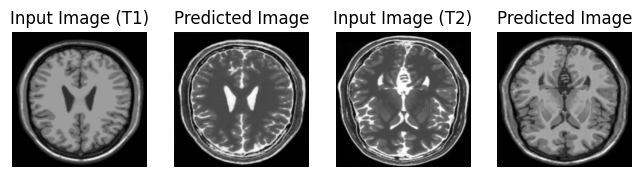

Checkpoint restored for epoch 80 at /content/T1_To_T2_MRI_checkpoints/ckpt-18
Time taken in 48 seconds for epoch 80



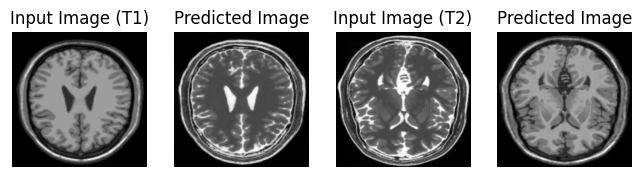

Time taken in 27 seconds for epoch 81



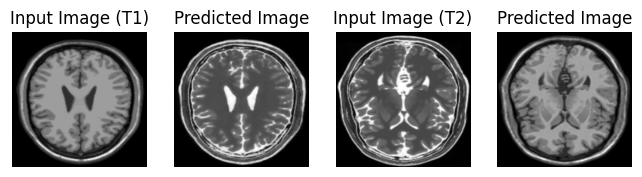

Time taken in 28 seconds for epoch 82



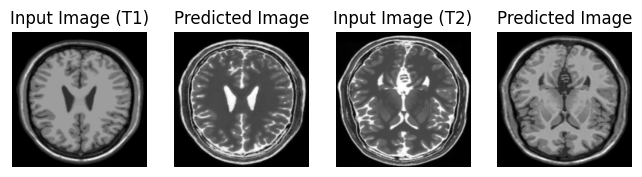

Time taken in 27 seconds for epoch 83



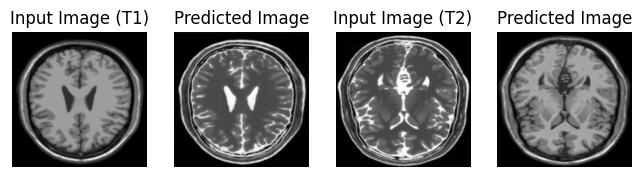

Time taken in 27 seconds for epoch 84



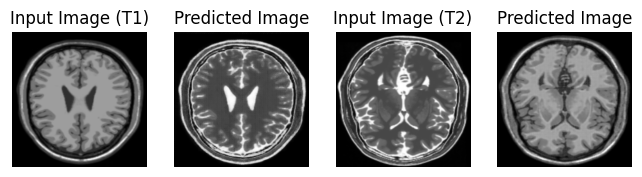

Time taken in 27 seconds for epoch 85



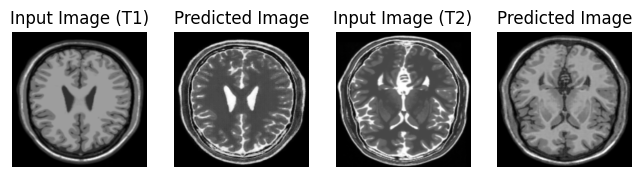

Time taken in 27 seconds for epoch 86



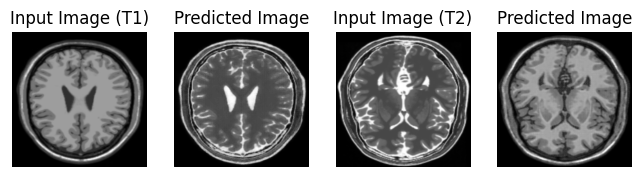

Time taken in 27 seconds for epoch 87



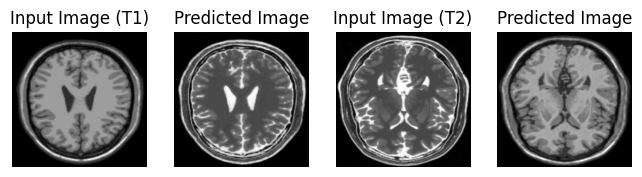

Time taken in 27 seconds for epoch 88



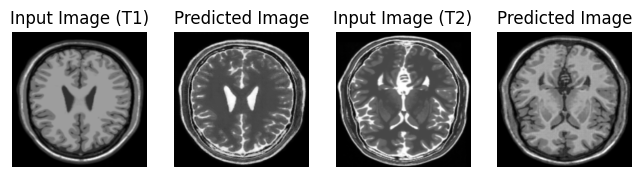

Time taken in 27 seconds for epoch 89



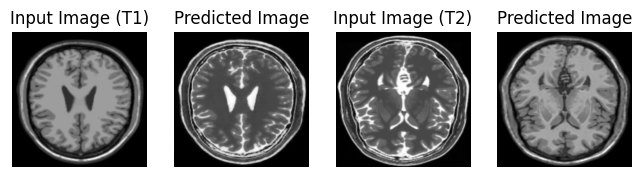

Checkpoint restored for epoch 90 at /content/T1_To_T2_MRI_checkpoints/ckpt-19
Time taken in 35 seconds for epoch 90



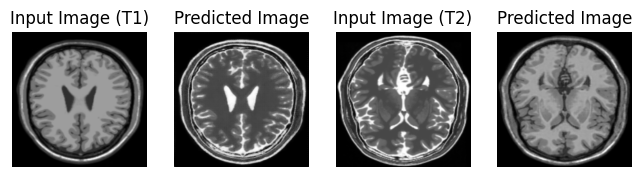

Time taken in 27 seconds for epoch 91



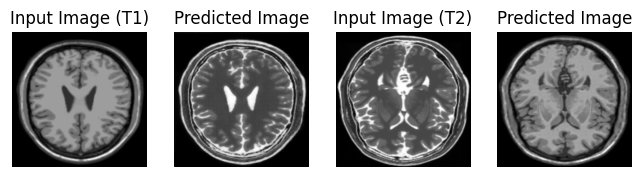

Time taken in 27 seconds for epoch 92



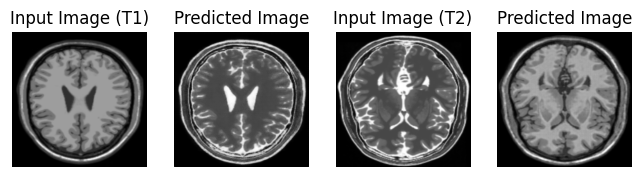

Time taken in 27 seconds for epoch 93



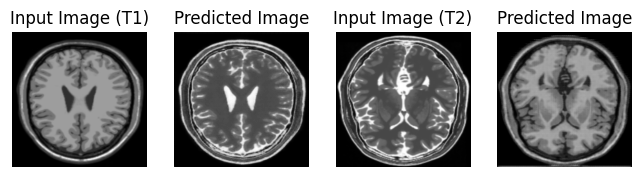

Time taken in 27 seconds for epoch 94



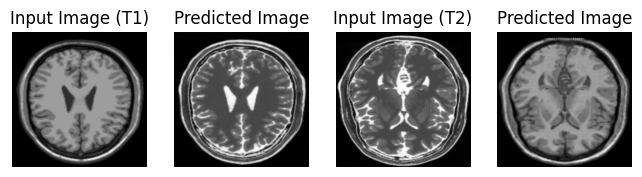

Time taken in 27 seconds for epoch 95



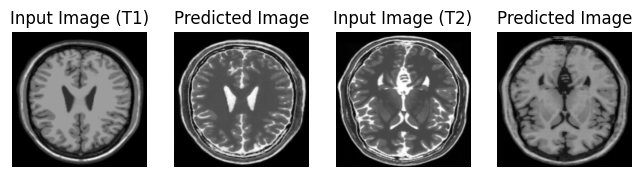

Time taken in 27 seconds for epoch 96



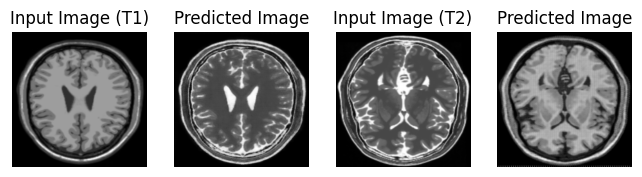

Time taken in 27 seconds for epoch 97



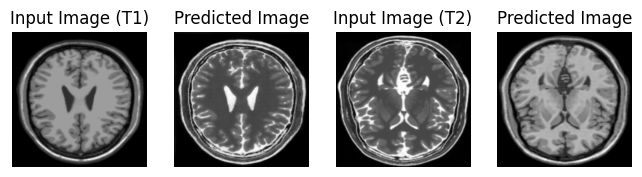

Time taken in 27 seconds for epoch 98



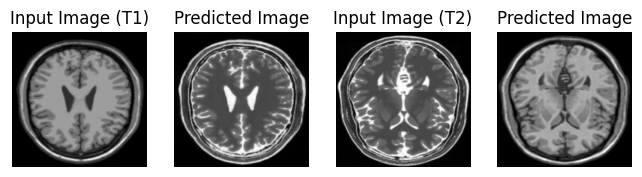

Time taken in 27 seconds for epoch 99



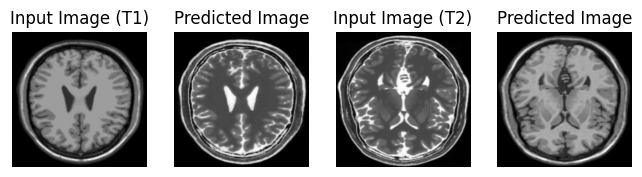

Checkpoint restored for epoch 100 at /content/T1_To_T2_MRI_checkpoints/ckpt-20


trained models saved at 000100
Time taken in 44 seconds for epoch 100



In [87]:
# training the model
for epoch in range(EPOCHS):
  start = time.time()
  for image_x, image_y in tf.data.Dataset.zip((T1, T2)): # preprocessed input
    train_step(image_x, image_y)
  if (epoch + 1) % 1 == 0:
    generate_images(generator_g, sample_t1, generator_f, sample_t2) # generates input and syntetic images
  if (epoch + 1) % 10 == 0:
    checkpoint_save_path = checkpoint_manager.save() # checkpoint saved for every 10 epochs in the given path
    print('Checkpoint restored for epoch {} at {}'.format(epoch+1, checkpoint_save_path))
  if (epoch + 1) == EPOCHS:
    save_final_model(epoch, generator_g, generator_f) # the last model is saved n the given path for further use
  print('Time taken in {} seconds for epoch {}\n'.format(round(time.time()-start),epoch + 1))

## Generating a GIF for visualization of Results
Notice the Quality of results we are getting better after each epoch

In [88]:
anim_file = 't1_to_t2_cyclegan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

In [89]:
pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-7q3yr1ov
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-7q3yr1ov
  Resolved https://github.com/tensorflow/docs to commit ec765851b8312bdc4dcf685e41020ce568c7bff2
  Preparing metadata (setup.py) ... done



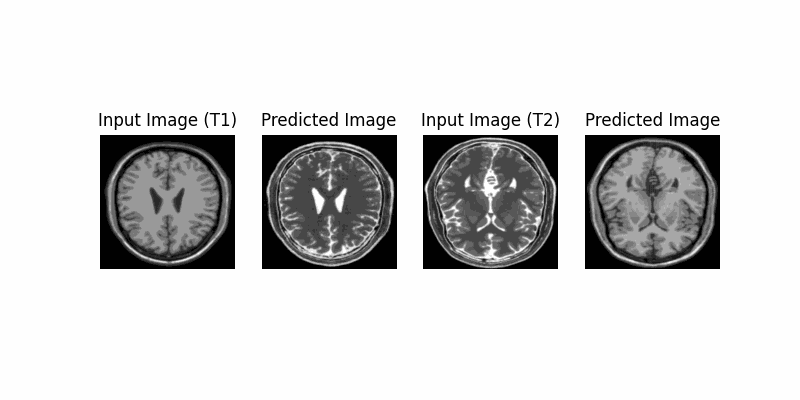

In [90]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

## Testing Final Model
Finally we will test the model by converting the generated image back to original image and comparing the input image (verifying cycle consistency)

In [91]:
# view generatoed images
def compare_images(model_g, model_f, input):
  generated_image = model_g(input)
  regenerated_image = model_f(generated_image)
  img_array = [input[0], generated_image[0], regenerated_image[0]]
  img_title = ['Input Image', 'Generated Image', 'Regenerated (cycled) Image']
  plt.figure(figsize=(12,9))
  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(img_title[i])
    plt.imshow(img_array[i].numpy()[:, :, 0], cmap='gray')
  plt.show()

In [95]:
from keras.models import load_model

custom_object = {'InstanceNormalization': InstanceNormalization} # custom_objects argument

# load models
model_g = load_model('/content/saved_model/T1_to_T2_final_model.h5', custom_object)
model_f = load_model('/content/saved_model/T2_to_T1_final_model.h5', custom_object)

#### Using T1
Using T1 type image to regenerate the image (cycled image)

T1 (original) -> T2 (Generated) -> T1 (cycled)

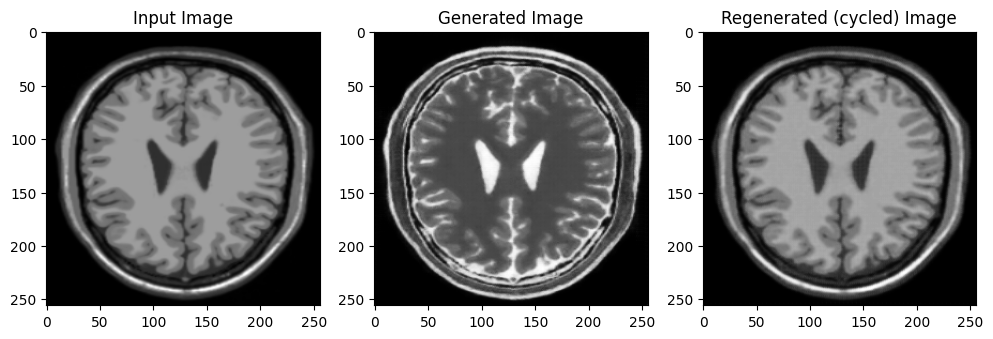

In [96]:
compare_images(model_g, model_f, sample_t1)

#### Using T2
Using T1 type image to regenerate the image (cycled image)

T2 (original) -> T1 (Generated) -> T2 (cycled)

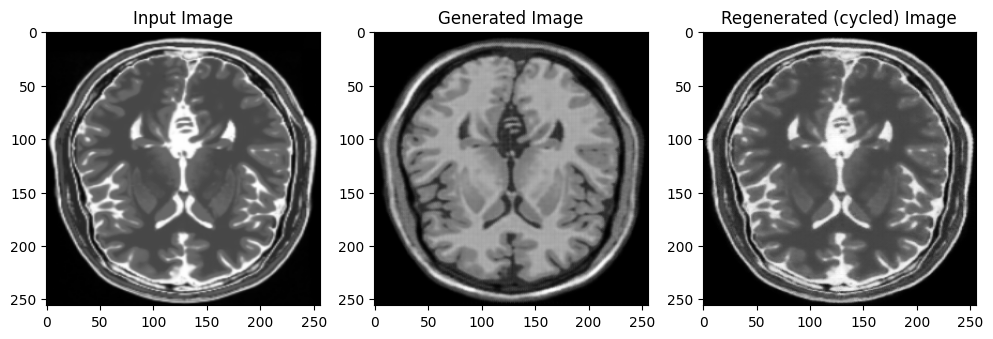

In [97]:
compare_images(model_f, model_g, sample_t2)